In [1]:
import deeplabcut
import os
from pathlib import Path

In [2]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

In [6]:
session.close()

In [3]:
task='ReachingBottom' # Enter the name of your experiment Task
experimenter='Sarah' # Enter the name of the experimenter

ddrive = "D:%s" % os.sep
dlcFolder = os.path.join(ddrive, 'DeepLabCut')
examplesFolder = os.path.join(dlcFolder, 'examples')
workingDir = os.path.join(dlcFolder, 'projects')

video = [os.path.join(ddrive, 'reachingvideos', '20200221_WT1_D1_bottom.avi'),
         os.path.join(ddrive, 'reachingvideos', '20200221_WT1_D2_bottom.avi'),]
#path_config_file=deeplabcut.create_new_project(task,experimenter,video, working_directory=workingDir,copy_videos=False)
path_config_file = os.path.join(workingDir, 'ReachingBottom-Sarah-2020-02-25', 'config.yaml') # Enter the path of the config file that was just created from the above step (check the folder)

In [4]:
videofile_path = os.path.join(workingDir, 'ReachingBottom-Sarah-2020-02-25', 'videos')
deeplabcut.create_labeled_video(path_config_file,[videofile_path], draw_skeleton=False)

Analyzing all the videos in the directory
Starting %  . ['D:\\DeepLabCut\\projects\\ReachingBottom-Sarah-2020-02-25\\videos']
Loading  20200221_WT1_D1_bottom.avi and data.
False 0 1280 0 1024
341
Duration of video [s]:  5.68 , recorded with  60.0 fps!
Overall # of frames:  341 with cropped frame dimensions:  1280 1024
Generating frames and creating video.


100%|█████████████████████████████████████████████████████████████████████████| 341/341 [00:04<00:00, 71.52it/s]


Starting %  . ['D:\\DeepLabCut\\projects\\ReachingBottom-Sarah-2020-02-25\\videos']
Loading  20200221_WT1_D2_bottom.avi and data.
False 0 1280 0 1024
500
Duration of video [s]:  8.33 , recorded with  60.0 fps!
Overall # of frames:  500 with cropped frame dimensions:  1280 1024
Generating frames and creating video.


100%|█████████████████████████████████████████████████████████████████████████| 500/500 [00:06<00:00, 73.23it/s]


Analyzing all the videos in the directory
20200221_WT1_D2_bottom.avi
Starting %  . ['D:\\DeepLabCut\\projects\\ReachingBottom-Sarah-2020-02-25\\videos']
.  already exists!
Loading  20200221_WT1_D2_bottom.avi and data.


<IPython.core.display.Javascript object>


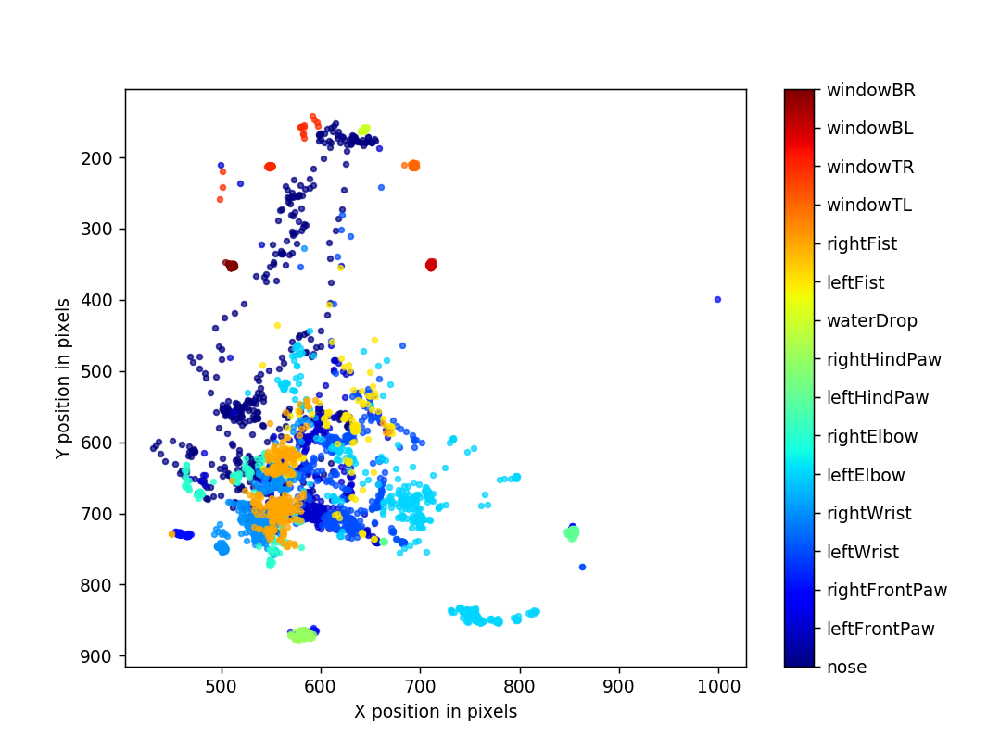

<IPython.core.display.Javascript object>


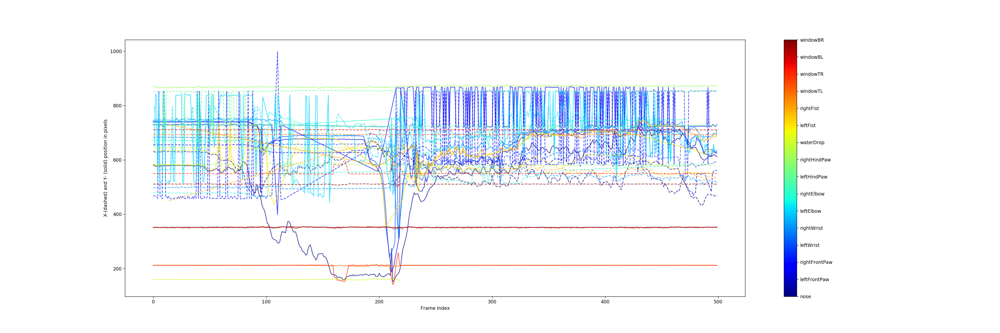

<IPython.core.display.Javascript object>


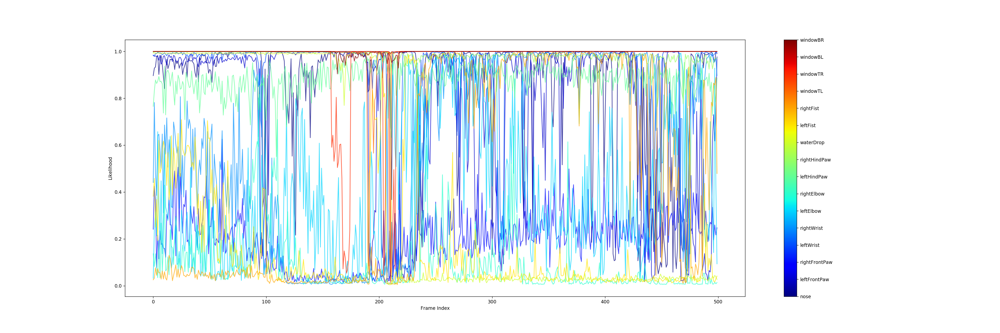

<IPython.core.display.Javascript object>


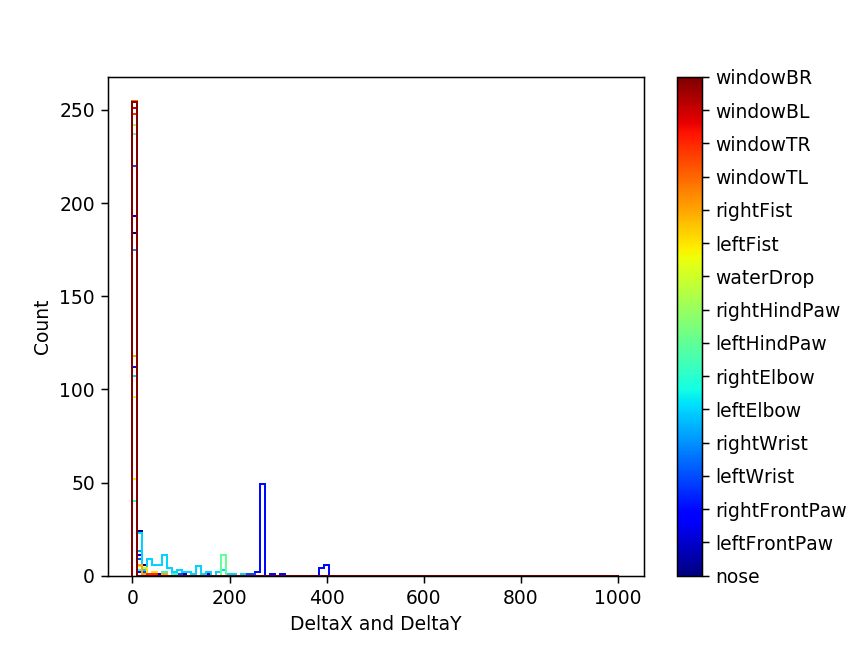

Plots created! Please check the directory "plot-poses" within the video directory
20200221_WT1_D1_bottom.avi
Starting %  . ['D:\\DeepLabCut\\projects\\ReachingBottom-Sarah-2020-02-25\\videos']
.  already exists!
.\plot-poses  already exists!
Loading  20200221_WT1_D1_bottom.avi and data.


<IPython.core.display.Javascript object>


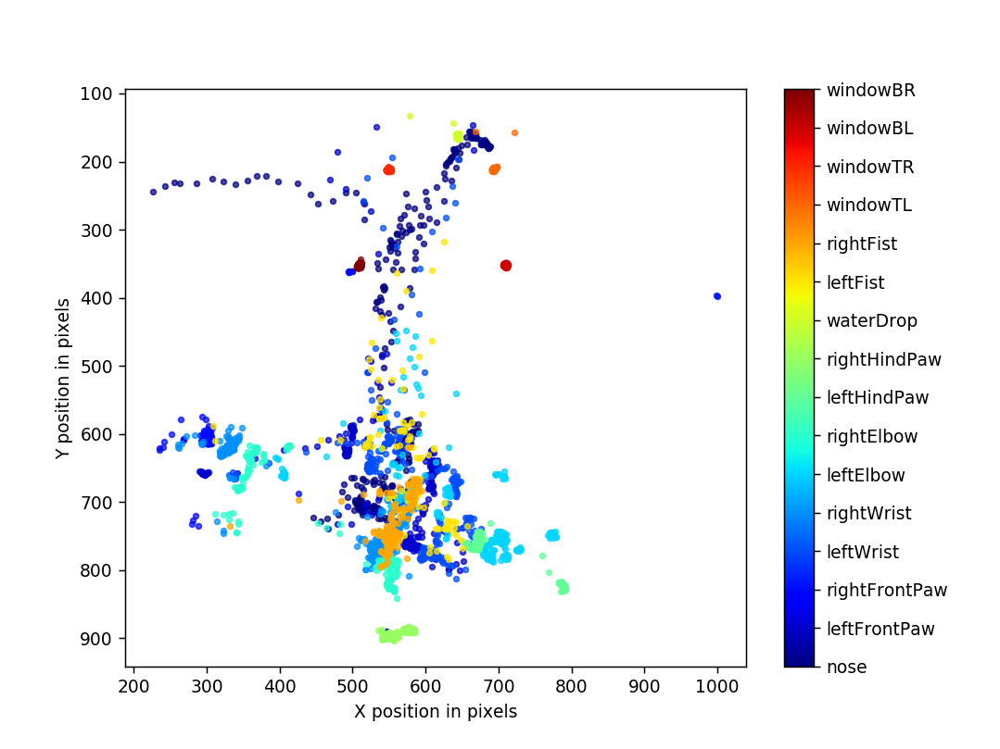

<IPython.core.display.Javascript object>


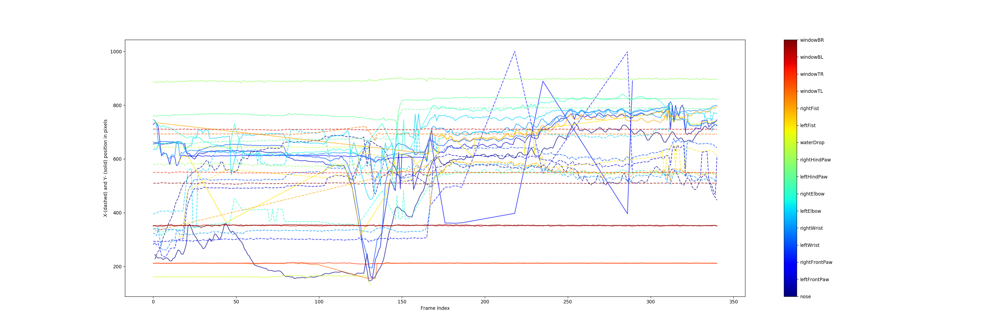

<IPython.core.display.Javascript object>


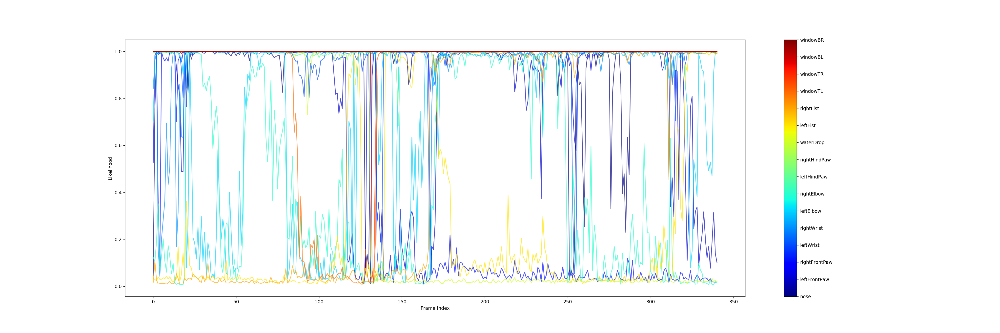

<IPython.core.display.Javascript object>


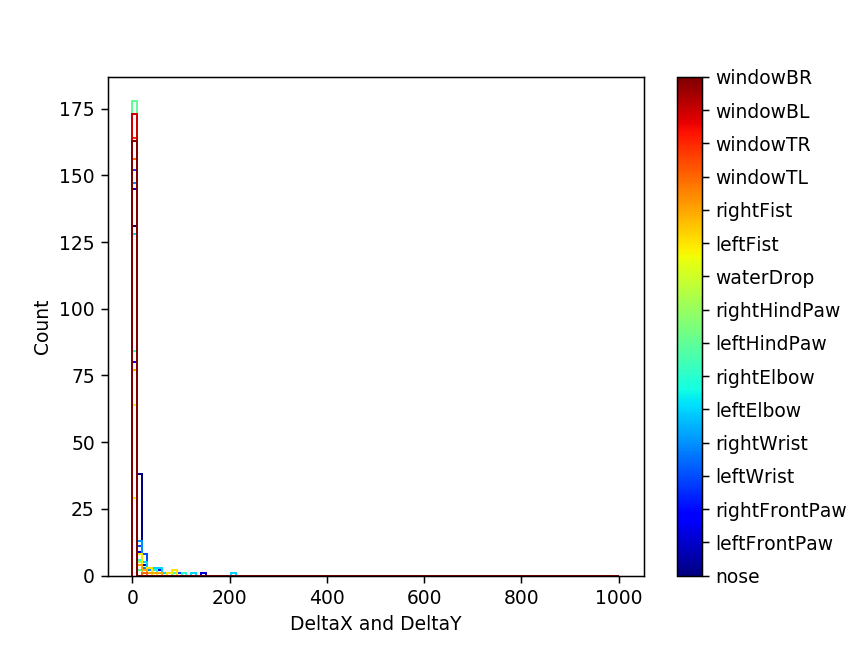

Plots created! Please check the directory "plot-poses" within the video directory


In [5]:
%matplotlib notebook
deeplabcut.plot_trajectories(path_config_file,[videofile_path],showfigures=True)

In [4]:
cfg=deeplabcut.auxiliaryfunctions.read_config(path_config_file)

In [8]:
cfg['bodyparts']=['nose', 'leftFrontPaw', 'rightFrontPaw', 'leftWrist', 'rightWrist', 'leftElbow', 'rightElbow', 'leftHindPaw', 'rightHindPaw', 'waterDrop', 'leftFist', 'rightFist', 'windowTL', 'windowTR', 'windowBL', 'windowBR']
cfg['numframes2pick']=40
deeplabcut.auxiliaryfunctions.write_config(path_config_file,cfg)

In [5]:
deeplabcut.create_training_dataset(path_config_file)
posefile=os.path.join(cfg['project_path'],'dlc-models' + os.sep +'iteration-'+str(cfg['iteration'])+os.sep+ cfg['Task'] + cfg['date'] + '-trainset' + str(int(cfg['TrainingFraction'][0] * 100)) + 'shuffle' + str(1),'train' + os.sep + 'pose_cfg.yaml')
DLC_config=deeplabcut.auxiliaryfunctions.read_plainconfig(posefile)
DLC_config['save_iters']=100
DLC_config['display_iters']=100
deeplabcut.auxiliaryfunctions.write_plainconfig(posefile,DLC_config)

D:\DeepLabCut\projects\ReachingBottom-Sarah-2020-02-25\labeled-data\20200221_WT1_D2_bottom/CollectedData_Sarah.h5  not found (perhaps not annotated)
The training dataset is successfully created. Use the function 'train_network' to start training. Happy training!


In [6]:
deeplabcut.train_network(path_config_file, gputouse=0)

Config:
{'all_joints': [[0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15]],
 'all_joints_names': ['nose',
                      'leftFrontPaw',
                      'rightFrontPaw',
                      'leftWrist',
                      'rightWrist',
                      'leftElbow',
                      'rightElbow',
                      'leftHindPaw',
                      'rightHindPaw',
                      'waterDrop',
                      'leftFist',
                      'rightFist',
                      'windowTL',
                      'windowTR',
                      'windowBL',
                      'windowBR'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio':

Starting with standard pose-dataset loader.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
Use `tf.cast` instead.
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from D:\anaconda\envs\dlc-windowsGPU\lib\site-packages\deeplabcut\pose_estimation_tensorflow\models\pretrained\resnet_v1_50.ckpt
Training parameter:
{'stride': 8.0, 'weigh_part_predictions': False, 'weigh_negatives': False, 'fg_fraction': 0.25, 'weigh_only_present_joints': False, 'mean_pixel': [123.68, 116.779, 103.939], 'shuffle': True, 'snapshot_prefix': 'D:\\DeepLabCut\\projects\\ReachingBottom-Sarah-2020-02-25\\dlc-models\\iteration-0\\ReachingBottomFeb25-trainset95shuffle1\\train\\snapshot', 'log_dir': 'log', 'global_scale': 0.8, 'location_refinement': True, 'locref_stdev': 7.2801, 'locref_loss_weight': 0.05, 'locref_huber_loss': True, 'optimizer': 'sgd', 'intermediate_super

iteration: 100 loss: 0.0827 lr: 0.005
iteration: 200 loss: 0.0237 lr: 0.005
iteration: 300 loss: 0.0204 lr: 0.005
iteration: 400 loss: 0.0195 lr: 0.005
iteration: 500 loss: 0.0189 lr: 0.005
iteration: 600 loss: 0.0158 lr: 0.005


Instructions for updating:
Use standard file APIs to delete files with this prefix.


iteration: 700 loss: 0.0184 lr: 0.005
iteration: 800 loss: 0.0161 lr: 0.005
iteration: 900 loss: 0.0147 lr: 0.005
iteration: 1000 loss: 0.0148 lr: 0.005
iteration: 1100 loss: 0.0150 lr: 0.005
iteration: 1200 loss: 0.0143 lr: 0.005
iteration: 1300 loss: 0.0127 lr: 0.005
iteration: 1400 loss: 0.0142 lr: 0.005
iteration: 1500 loss: 0.0133 lr: 0.005
iteration: 1600 loss: 0.0124 lr: 0.005
iteration: 1700 loss: 0.0115 lr: 0.005
iteration: 1800 loss: 0.0118 lr: 0.005
iteration: 1900 loss: 0.0113 lr: 0.005
iteration: 2000 loss: 0.0117 lr: 0.005
iteration: 2100 loss: 0.0111 lr: 0.005
iteration: 2200 loss: 0.0109 lr: 0.005
iteration: 2300 loss: 0.0107 lr: 0.005
iteration: 2400 loss: 0.0111 lr: 0.005
iteration: 2500 loss: 0.0097 lr: 0.005
iteration: 2600 loss: 0.0107 lr: 0.005
iteration: 2700 loss: 0.0100 lr: 0.005
iteration: 2800 loss: 0.0102 lr: 0.005
iteration: 2900 loss: 0.0096 lr: 0.005
iteration: 3000 loss: 0.0095 lr: 0.005
iteration: 3100 loss: 0.0088 lr: 0.005
iteration: 3200 loss: 0.0087

iteration: 42700 loss: 0.0021 lr: 0.02
iteration: 42800 loss: 0.0020 lr: 0.02
iteration: 42900 loss: 0.0024 lr: 0.02
iteration: 43000 loss: 0.0021 lr: 0.02
iteration: 43100 loss: 0.0019 lr: 0.02
iteration: 43200 loss: 0.0017 lr: 0.02
iteration: 43300 loss: 0.0020 lr: 0.02
iteration: 43400 loss: 0.0020 lr: 0.02
iteration: 43500 loss: 0.0019 lr: 0.02
iteration: 43600 loss: 0.0022 lr: 0.02
iteration: 43700 loss: 0.0020 lr: 0.02
iteration: 43800 loss: 0.0019 lr: 0.02
iteration: 43900 loss: 0.0019 lr: 0.02
iteration: 44000 loss: 0.0020 lr: 0.02
iteration: 44100 loss: 0.0020 lr: 0.02
iteration: 44200 loss: 0.0021 lr: 0.02
iteration: 44300 loss: 0.0018 lr: 0.02
iteration: 44400 loss: 0.0019 lr: 0.02
iteration: 44500 loss: 0.0023 lr: 0.02
iteration: 44600 loss: 0.0019 lr: 0.02
iteration: 44700 loss: 0.0018 lr: 0.02
iteration: 44800 loss: 0.0020 lr: 0.02
iteration: 44900 loss: 0.0018 lr: 0.02
iteration: 45000 loss: 0.0020 lr: 0.02
iteration: 45100 loss: 0.0018 lr: 0.02
iteration: 45200 loss: 0.

KeyboardInterrupt: 

In [16]:
#newVids = [os.path.join(ddrive, 'academy_videos', 'f-cam', 'M22_HoldBite_1561429194_FrontVideo.avi')]
deeplabcut.add_new_videos(path_config_file, newVids)
#deeplabcut.add_new_videos?

Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
Creating the symbolic link of the video
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.


In [5]:
%matplotlib inline
#there are other ways to grab frames, such as uniformly; please see the paper:

#AUTOMATIC:
deeplabcut.extract_frames(path_config_file) 

Config file read successfully.
Do you want to extract (perhaps additional) frames for video: D:\reachingvideos\20200221_WT1_D1_bottom.avi ?
yes/nono
Do you want to extract (perhaps additional) frames for video: D:\reachingvideos\20200221_WT1_D2_bottom.avi ?
yes/nono

Frames were selected.
You can now label the frames using the function 'label_frames' (if you extracted enough frames for all videos).


In [ ]:
%gui wx
deeplabcut.label_frames(path_config_file)

You can now check the labels, using 'check_labels' before proceeding. Then, you can use the function 'create_training_dataset' to create the training dataset.


In [7]:
deeplabcut.check_labels(path_config_file) #this creates a subdirectory with the frames + your labels

Creating images with labels by Sarah.
They are stored in the following folder: D:\DeepLabCut\projects\ReachingTop-Sarah-2020-02-24\labeled-data\20200221_WT1_D1_top_labeled.
Attention: D:\DeepLabCut\projects\ReachingTop-Sarah-2020-02-24\labeled-data\20200221_WT1_D2_top does not appear to have labeled data!
If all the labels are ok, then use the function 'create_training_dataset' to create the training dataset!


D:\DeepLabCut\projects\HoldBiteFront-Sarah-2019-08-28\training-datasets\iteration-0\UnaugmentedDataSet_HoldBiteFrontAug28  already exists!
D:\DeepLabCut\projects\HoldBiteFront-Sarah-2019-08-28\labeled-data\M20_HoldBite_1561092244_FrontVideo/CollectedData_Sarah.h5  not found (perhaps not annotated)
D:\DeepLabCut\projects\HoldBiteFront-Sarah-2019-08-28\labeled-data\M20_HoldBite_1561089546_FrontVideo/CollectedData_Sarah.h5  not found (perhaps not annotated)
D:\DeepLabCut\projects\HoldBiteFront-Sarah-2019-08-28\labeled-data\M20_HoldBite_1561085754_FrontVideo/CollectedData_Sarah.h5  not found (perhaps not annotated)
D:\DeepLabCut\projects\HoldBiteFront-Sarah-2019-08-28\dlc-models\iteration-0\HoldBiteFrontAug28-trainset95shuffle1  already exists!
D:\DeepLabCut\projects\HoldBiteFront-Sarah-2019-08-28\dlc-models\iteration-0\HoldBiteFrontAug28-trainset95shuffle1//train  already exists!
D:\DeepLabCut\projects\HoldBiteFront-Sarah-2019-08-28\dlc-models\iteration-0\HoldBiteFrontAug28-trainset95shuf

In [24]:
posefile

'D:\\DeepLabCut\\projects\\HoldBiteFront-Sarah-2019-08-28\\dlc-models\\iteration-0\\HoldBiteFrontAug28-trainset95shuffle1\\train\\pose_cfg.yaml'

In [7]:
deeplabcut.evaluate_network(path_config_file, plotting=True)

Config:
{'all_joints': [[0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15]],
 'all_joints_names': ['nose',
                      'leftFrontPaw',
                      'rightFrontPaw',
                      'leftWrist',
                      'rightWrist',
                      'leftElbow',
                      'rightElbow',
                      'leftHindPaw',
                      'rightHindPaw',
                      'waterDrop',
                      'leftFist',
                      'rightFist',
                      'windowTL',
                      'windowTR',
                      'windowBL',
                      'windowBR'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio':

Running  DeepCut_resnet50_ReachingBottomFeb25shuffle1_66600  with # of trainingiterations: 66600
INFO:tensorflow:Restoring parameters from D:\DeepLabCut\projects\ReachingBottom-Sarah-2020-02-25\dlc-models\iteration-0\ReachingBottomFeb25-trainset95shuffle1\train\snapshot-66600
Analyzing data...


40it [00:11,  3.60it/s]


Done and results stored for snapshot:  snapshot-66600
Results for 66600  training iterations: 95 1 train error: 2.05 pixels. Test error: 6.41  pixels.
With pcutoff of 0.1  train error: 2.05 pixels. Test error: 5.88 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Plotting...
The network is evaluated and the results are stored in the subdirectory 'evaluation_results'.
If it generalizes well, choose the best model for prediction and update the config file with the appropriate index for the 'snapshotindex'.
Use the function 'analyze_video' to make predictions on new videos.
Otherwise consider retraining the network (see DeepLabCut workflow Fig 2)


In [8]:
videofile_path = [os.path.join(ddrive, 'DeepLabCut', 'projects', 'ReachingBottom-Sarah-2020-02-25', 'videos')]
deeplabcut.analyze_videos(path_config_file,videofile_path, videotype='.avi', save_as_csv=True)

Config:
{'all_joints': [[0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15]],
 'all_joints_names': ['nose',
                      'leftFrontPaw',
                      'rightFrontPaw',
                      'leftWrist',
                      'rightWrist',
                      'leftElbow',
                      'rightElbow',
                      'leftHindPaw',
                      'rightHindPaw',
                      'waterDrop',
                      'leftFist',
                      'rightFist',
                      'windowTL',
                      'windowTR',
                      'windowBL',
                      'windowBR'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio':

Using snapshot-66600 for model D:\DeepLabCut\projects\ReachingBottom-Sarah-2020-02-25\dlc-models\iteration-0\ReachingBottomFeb25-trainset95shuffle1
num_outputs =  1
INFO:tensorflow:Restoring parameters from D:\DeepLabCut\projects\ReachingBottom-Sarah-2020-02-25\dlc-models\iteration-0\ReachingBottomFeb25-trainset95shuffle1\train\snapshot-66600
Analyzing all the videos in the directory
Starting to analyze %  20200221_WT1_D2_bottom.avi
Loading  20200221_WT1_D2_bottom.avi
Duration of video [s]:  8.33 , recorded with  60.0 fps!
Overall # of frames:  500  found with (before cropping) frame dimensions:  1280 1024
Starting to extract posture


510it [01:50,  4.97it/s]                                                                                        

Detected frames:  500


510it [01:51,  4.56it/s]


Saving results in ....
Saving csv poses!
Starting to analyze %  20200221_WT1_D1_bottom.avi
Loading  20200221_WT1_D1_bottom.avi
Duration of video [s]:  5.68 , recorded with  60.0 fps!
Overall # of frames:  341  found with (before cropping) frame dimensions:  1280 1024
Starting to extract posture


350it [01:11,  4.93it/s]                                                                                        

Detected frames:  341


350it [01:13,  4.77it/s]


Saving results in ....
Saving csv poses!
The videos are analyzed. Now your research can truly start! 
 You can create labeled videos with 'create_labeled_video'.
If the tracking is not satisfactory for some videos, consider expanding the training set. You can use the function 'extract_outlier_frames' to extract any outlier frames!


'DeepCut_resnet50_ReachingBottomFeb25shuffle1_66600'

In [13]:
os.path.isfile(os.sep.join(['D:', 'academy_videos', 'f-cam', 'M18_HoldBite_1561436695_FrontVideo.avi']))
#os.path.isfile("D:\academy_videos\f-cam\M18_HoldBite_1561436695_FrontVideo.avi")

True